# Feature investigation with correlation matrix (APOC) membrane channel

In [1]:
import napari
from napari.utils import nbscreenshot
import pandas as pd
from os import listdir
from os.path import isfile, join
import numpy as np
import os
from skimage.io import imread
import numpy as np
from skimage import measure
from napari_clusters_plotter._dimensionality_reduction import DimensionalityReductionWidget
from napari_clusters_plotter._dock_widget import PlotterWidget
from napari_skimage_regionprops import add_table

## Merging timepoints and opening nuclei-, membrane- and label-channel in napari

We use a timelapse dataset of the marine annelid Platynereis dumerilii from  [Ozpolat, B. et al](https://doi.org/10.5281/zenodo.1063531) licensed by [CC BY 4.0](https://creativecommons.org/licenses/by/4.0/legalcode) (rescaled to 256x256x103). We use the nuclei-channel, the membrane-channel and [StarDist](https://github.com/stardist/stardist)-labels. Currently, the individual timepoints are as tif-files in separate folders. So we merge these timepoints first by opening them as a stack in napari.

In [2]:
nuclei_loc = "C:/Users/maral/Documents/WHK Bio-image Analysis Group/1. Nuclei und Zellen segmentieren, tracken, klassifizieren/Image 6 single timepoints gaussian (256x256x103)/"
membrane_loc = "C:/Users/maral/Documents/WHK Bio-image Analysis Group/1. Nuclei und Zellen segmentieren, tracken, klassifizieren/Image 6 single timepoints gaussian channel 0(256x256x103)/"
label_loc = "C:/Users/maral/Documents/WHK Bio-image Analysis Group/1. Nuclei und Zellen segmentieren, tracken, klassifizieren/Image 6 single timepoints labels/"

In [3]:
#append directory and sort
def get_sorted_image_list(directory):
    files = [join(directory, f) for f in listdir(directory) if isfile(join(directory, f)) and f.endswith('tif')]
    return sorted(files)

In [4]:
all_nuclei_locs = get_sorted_image_list(nuclei_loc)
all_membrane_locs = get_sorted_image_list(membrane_loc)
all_label_locs = get_sorted_image_list(label_loc)

In [5]:
#open napari 
viewer = napari.Viewer()
nuclei_layer = viewer.open(all_nuclei_locs, stack=True, plugin="builtins", name = "nuclei")
membrane_layer = viewer.open(all_membrane_locs, stack=True, plugin="builtins", name = "membranes")

C:\Users\maral\mambaforge\envs\ncp_paper\lib\site-packages\napari\components\viewer_model.py:977: UserWarning: The "builtins" plugin name is deprecated and will not work in a future version. Please use "napari" instead.
  warnings.warn(
C:\Users\maral\mambaforge\envs\ncp_paper\lib\site-packages\napari\components\viewer_model.py:977: UserWarning: The "builtins" plugin name is deprecated and will not work in a future version. Please use "napari" instead.
  warnings.warn(


In [6]:
viewer.dims.ndisplay=3

In the viewer, we see that some of the objects which are in the nuclei-channel are also present in the membrane channel:

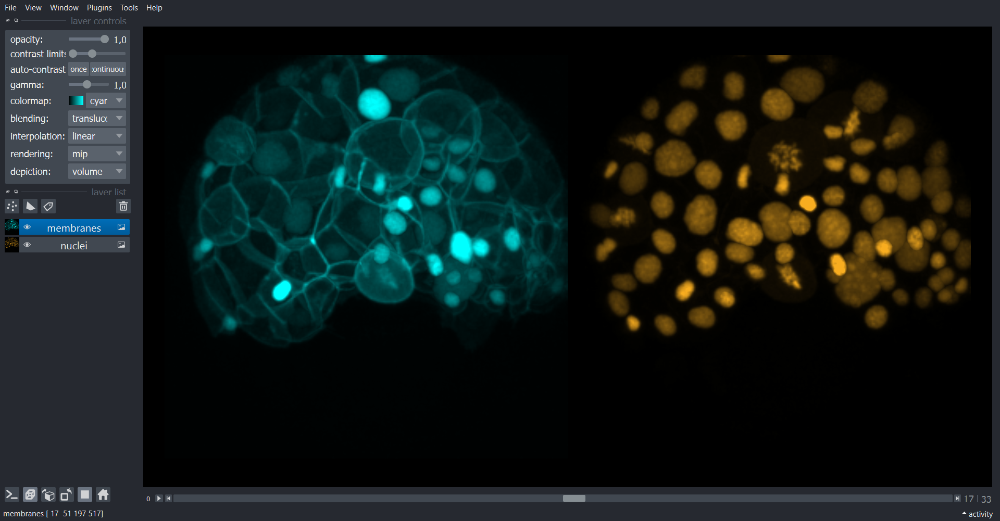

In [7]:
nbscreenshot(viewer)

## Feature extraction

### ... from membrane channel

> **_Note:_** We use a selection of parameters: `area` as a size-based parameters, `feret_diameter_max` and `solidity` as shape-based parameters and the `intensity_mean` as intensity-based parameter. 

In [7]:
membrane_list = []
for labels, membrane, i in zip(all_label_locs, all_membrane_locs, range(len(all_membrane_locs))):
    labels = imread(labels)
    membrane = imread(membrane)
    table = pd.DataFrame(measure.regionprops_table(labels, membrane, properties=['label', 
                                                                                'area', 
                                                                                'feret_diameter_max', 
                                                                                'solidity', 
                                                                                'intensity_mean'
    ]))
    table['frame'] = i
    membrane_list.append(table)

In [8]:
membrane_table = pd.concat(membrane_list)
membrane_table

,label,area,feret_diameter_max,solidity,intensity_mean,frame
0,1,39213,59.270566,0.946579,0.370741,0
1,2,24982,52.545219,0.944035,0.067627,0
2,3,21173,45.880279,0.932690,0.045129,0
3,4,17760,39.761791,0.931501,0.034841,0
4,5,18332,45.000000,0.942180,0.047609,0
...,...,...,...,...,...,...
192,193,1516,17.233688,0.912154,0.022349,33
193,194,663,20.420578,0.815498,0.206956,33
194,195,1638,21.794495,0.900495,0.056816,33
195,196,1737,24.372115,0.802680,0.088481,33


In [10]:
viewer.open(all_label_locs, stack=True, plugin="builtins", layer_type = "labels", features = membrane_table, name = "nuclei labels")
label_layer = viewer.layers["nuclei labels"]
add_table(label_layer, viewer)

C:\Users\maral\mambaforge\envs\ncp_paper\lib\site-packages\napari\components\viewer_model.py:977: UserWarning: The "builtins" plugin name is deprecated and will not work in a future version. Please use "napari" instead.
  warnings.warn(


Napari status bar display of label properties disabled because https://github.com/napari/napari/issues/5417 and https://github.com/napari/napari/issues/4342


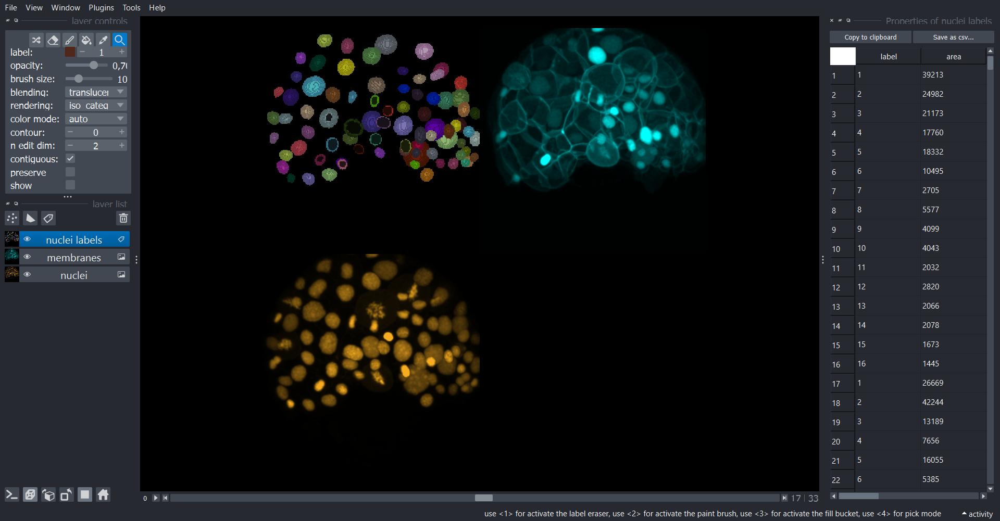

In [11]:
nbscreenshot(viewer)

## Dimensionality reduction

In [12]:
dimensionality_reduction_widget = DimensionalityReductionWidget(viewer)
dimensionality_reduction_dock_widget = viewer.window.add_dock_widget(dimensionality_reduction_widget)

Then, we select UMAP as a dimensionality reduction algorithm and run the dimensionality reduction.

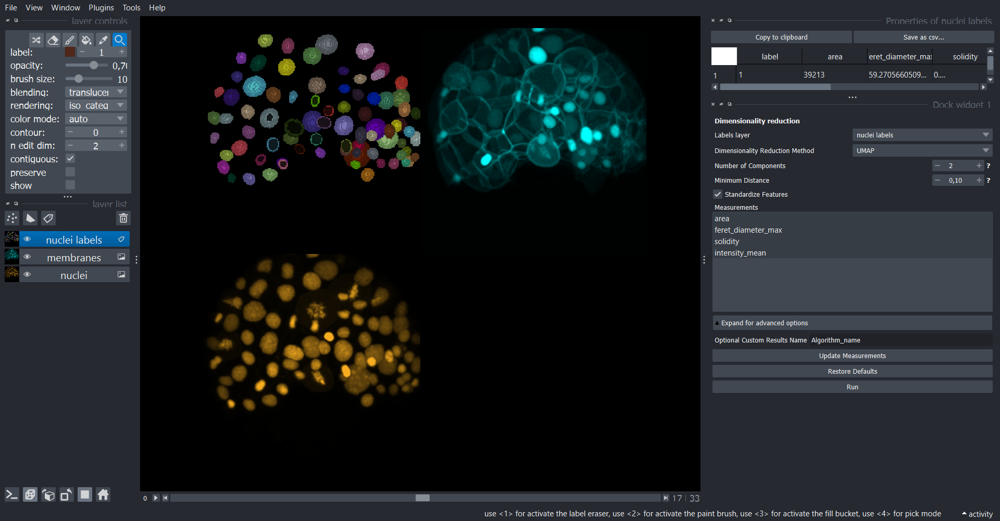

Selected labels layer: nuclei labels
Selected measurements: ['area', 'feret_diameter_max', 'solidity', 'intensity_mean']


C:\Users\maral\mambaforge\envs\ncp_paper\lib\site-packages\umap\distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
C:\Users\maral\mambaforge\envs\ncp_paper\lib\site-packages\umap\distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
C:\Users\maral\mambaforge\envs\ncp_paper\lib\site-packages\umap\distances.py:108

Napari status bar display of label properties disabled because https://github.com/napari/napari/issues/5417 and https://github.com/napari/napari/issues/4342
Dimensionality reduction finished


In [13]:
nbscreenshot(viewer)

In [14]:
dimensionality_reduction_widget.hide()

## Plotting

In [15]:
plotter_widget = PlotterWidget(viewer)
plotter_dock_widget = viewer.window.add_dock_widget(plotter_widget)

In [ ]:
plotter_widget.plot_x_axis.setCurrentText("UMAP_0")
plotter_widget.plot_y_axis.setCurrentText("UMAP_1")

# workaround to click run button programmatically
layout = plotter_widget.layout()
widgetitem = layout.itemAt(layout.count()-2)
run_button = widgetitem.widget().layout().itemAt(0).widget()
run_button.clicked.emit()

We can see that one datapoint is not clustered together with the others:

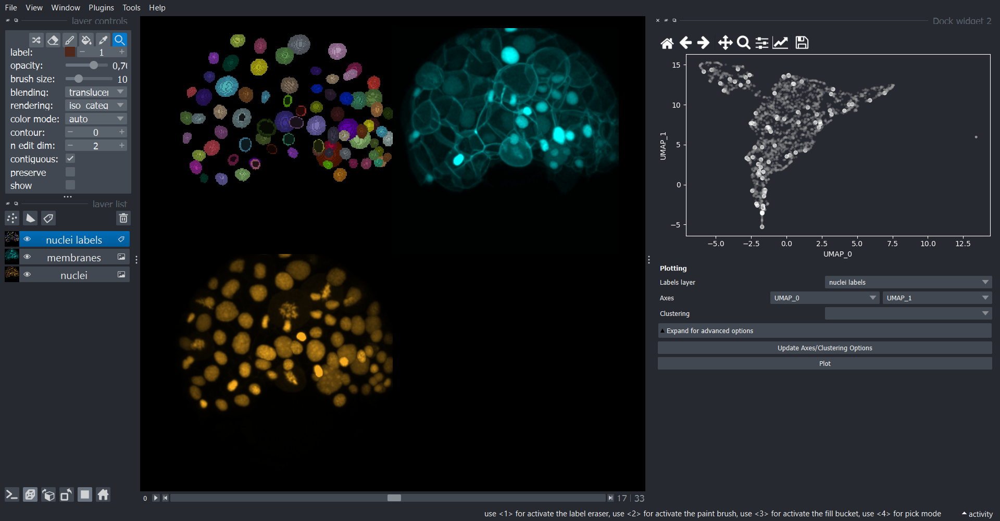

In [17]:
nbscreenshot(viewer)

## Manual clustering

We can select it using manual clustering with the lasso tool:

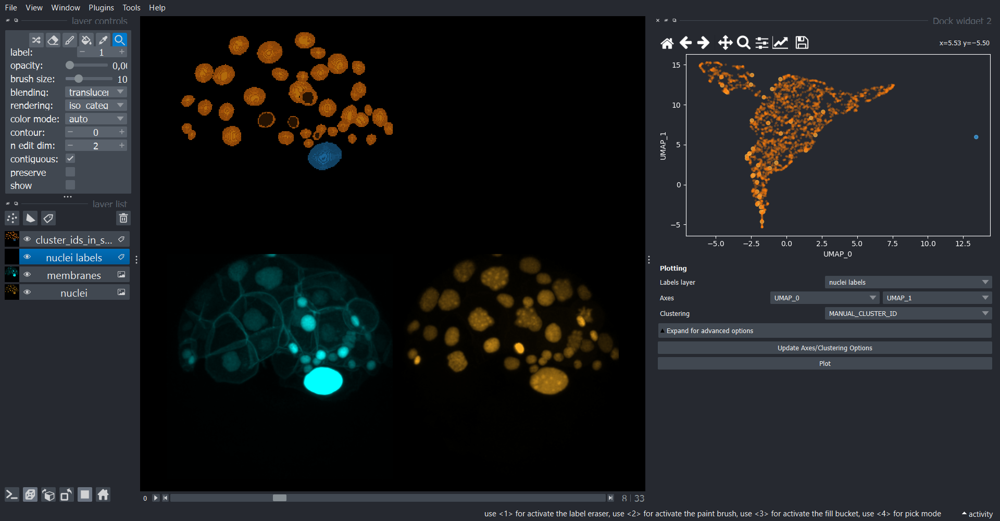

In [18]:
nbscreenshot(viewer)

By holding `SHIFT`, we can select more than one cluster ID:

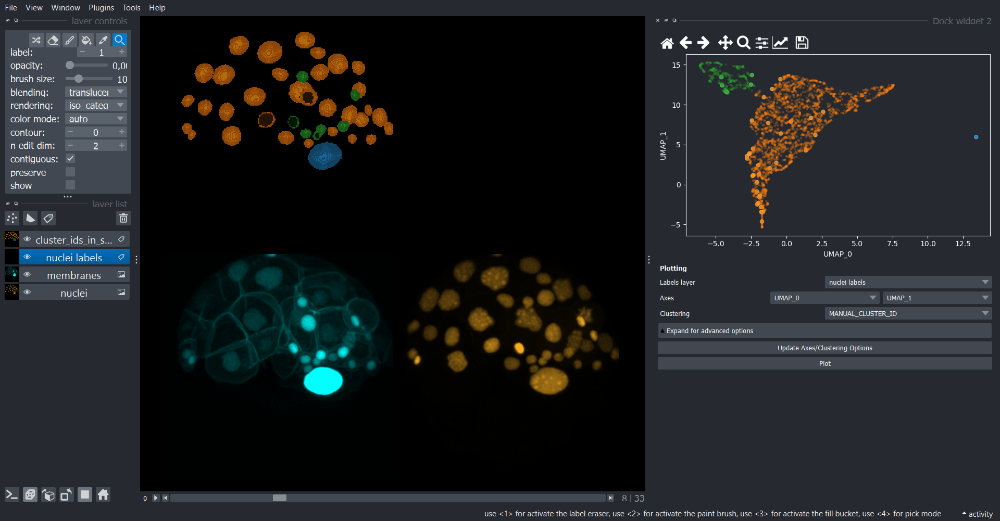

In [19]:
nbscreenshot(viewer)

We can now generate the hypothesis that blue and green labels correspond to bright objects in the membrane channel. And the green objects seem to have a similar size. We can investigate these hypotheses by plotting different measurements against each other:

Plot `area` against `solidity`:

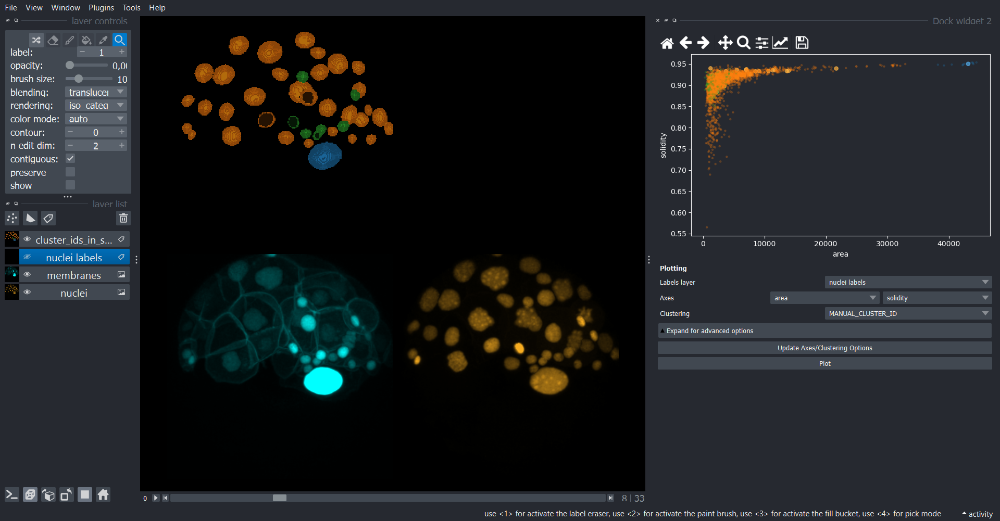

In [21]:
nbscreenshot(viewer)

Plot timelapse `frame` against the `intensity_mean`: green and blue labels seem to have higher `intensity_mean` than the orange ones:

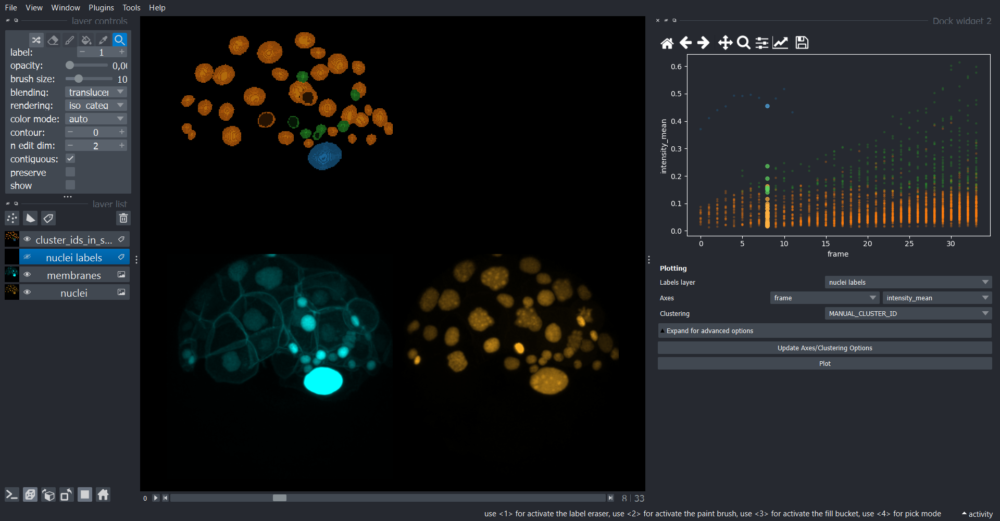

In [22]:
nbscreenshot(viewer)

We can also plot a histogram of `intensity_mean`. Therefore, we need to select it on both axes, x and y and select `HISTOGRAM` in the advanced option section.

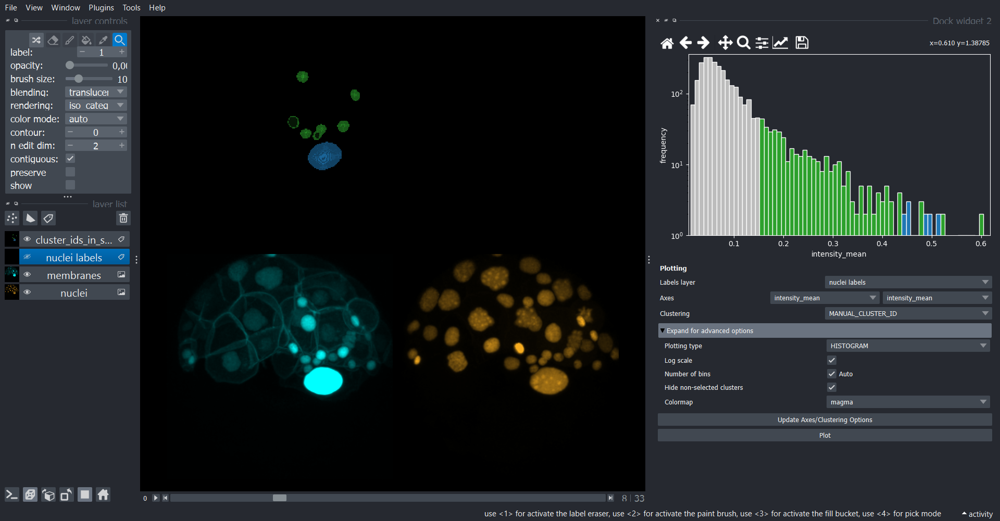

In [23]:
nbscreenshot(viewer)

Plot `area` against `intensity_mean`: Green labels seem to have a smaller `area`, but higher `intensity_mean`. Blue seems to have both high `area` and `intensity_mean`:

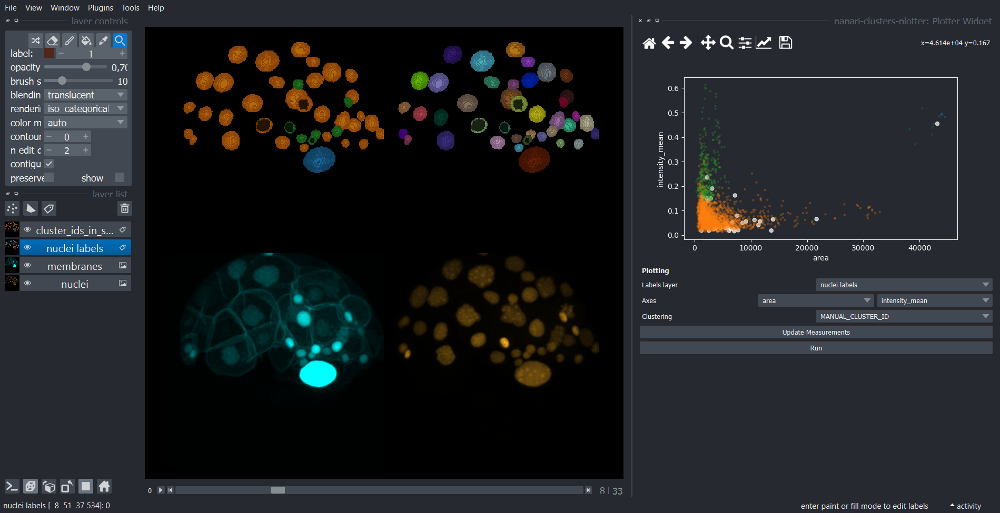

In [33]:
nbscreenshot(viewer)

We can see that our result is an interplay between shape- and intensity-based parameters. And we can explore that by switching between different spaces and visualizing them.

# Correlation matrix

We are now having a look on the correlation matrix to understand which parameter was influencing  the output of the UMAP. Therefore, we use [napari-apoc](https://github.com/haesleinhuepf/napari-accelerated-pixel-and-object-classification)

Therefore we go to `Tools`--> `Measurements tables` --> `Feature correlation matrix (pandas, APOC)`

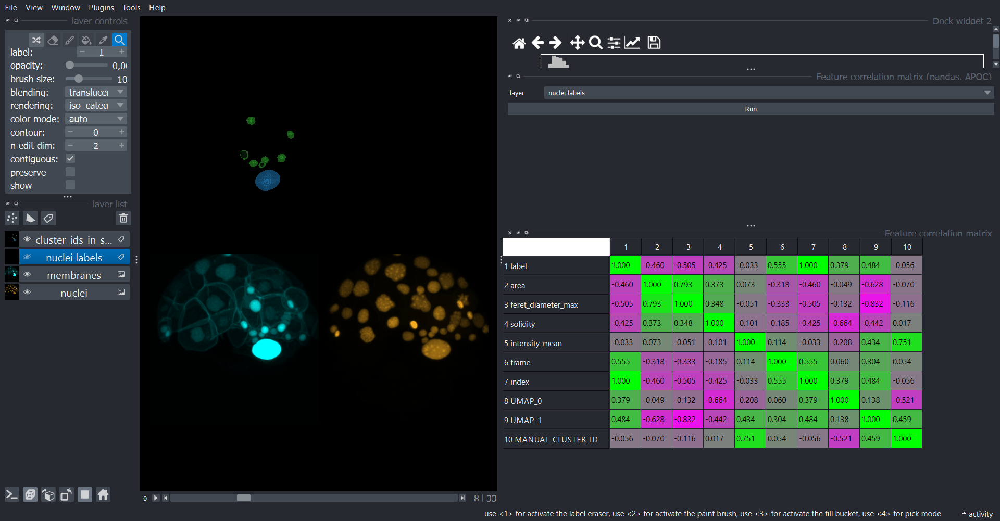

In [24]:
nbscreenshot(viewer)

My expectation would have been to see a correlation between `intensity_mean` and either `UMAP_0` or `UMAP_1` indicating that it plays a bigger role for the computation of the UMAP. But there is only a weak correlation to `UMAP_1`.